# (09) Feeder test

project = ```iP-VAE```, host = ```mach```, device = ```cuda:1```

**Motivation**: <br>

Testing DataFeeder objects:
- JittterFeeder: on ```MNIST``` and ```vH32```
- RotatingMNISTFeeder
- StationaryFeeder: on ```vH16```

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
# from analysis.eval import sparse_score
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from figures.imgs import plot_weights


device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: mach

## 1) JitterFeeder

In [3]:
from base.dataset import make_dataloader
from main.datafeeder import JitterFeeder

mnist =  make_dataloader('MNIST', device)[1]
vh32 =  make_dataloader('vH32', device)[1]

### mnist (mode=```pad```)

In [4]:
x = next(iter(mnist))[0]
print(x.shape)

feeder = JitterFeeder(
    x=x,
    mode='pad',
    diff_coeff=0.6,
    harmonic_strength=0.03,
    crop_size=None,
    flatten=False,
)

torch.Size([256, 1, 28, 28])

In [5]:
frames = []
for t in range(1000):
    frame = feeder.get_frame(t)
    frames.append(frame)

frames = torch.cat(frames, dim=1)
frames.shape

torch.Size([256, 1000, 28, 28])

In [6]:
from utils.animation import show_movie

show_movie(frames[0], max_n=1000, figsize=(4.5, 3.0))

In [7]:
var_samples = torch.var(frames, dim=1)
var_all = torch.var(frames, dim=[0, 1])

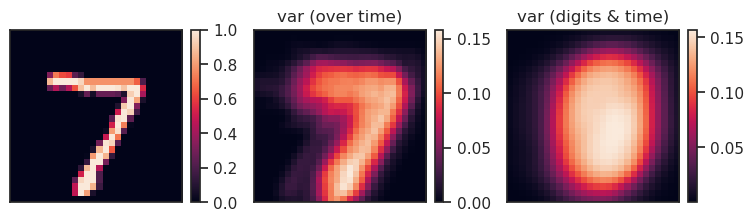

In [8]:
i = 0

ims = []
fig, axes = create_figure(1, 3, (7.5, 2.1), 'all', 'all')
ims.append(axes[0].imshow(tonp(x[i].squeeze())))
ims.append(axes[1].imshow(tonp(var_samples[i])))
ims.append(axes[2].imshow(tonp(var_all)))

axes[1].set_title('var (over time)')
axes[2].set_title('var (digits & time)')

for im, ax in zip(ims, axes):
    plt.colorbar(im, ax=ax)
remove_ticks(axes, False)

In [9]:
traj = tonp(torch.stack(feeder.trajectory))
traj = pd.DataFrame({
    'x': traj[:, 0],
    'y': traj[:, 1],
    't': range(len(traj)),
})

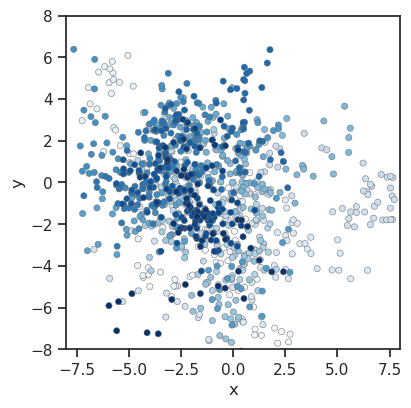

In [10]:
fig, ax = create_figure(1, 1, (4, 4))
sns.scatterplot(data=traj, x='x', y='y', s=20, c=traj['t'], cmap='Blues', edgecolor='dimgrey')
lim = (-8, 8)
ax.set(xlim=lim, ylim=lim)
ax_square(ax)
plt.show()

### vH32 (crop)

In [11]:
x = next(iter(vh32))[0]
print(x.shape)

feeder = JitterFeeder(
    x=x,
    mode='crop',
    diff_coeff=0.5,
    harmonic_strength=0.01,
    crop_size=16,
    flatten=False,
)

torch.Size([256, 1, 32, 32])

In [12]:
frames = []
for t in range(1000):
    frame = feeder.get_frame(t)
    frames.append(frame)

frames = torch.cat(frames, dim=1)
frames.shape

torch.Size([256, 1000, 16, 16])

In [13]:
from utils.animation import show_movie

show_movie(frames[0], max_n=1000, figsize=(3.5, 2.0))

In [14]:
var_samples = torch.var(frames, dim=1)
var_all = torch.var(frames, dim=[0, 1])

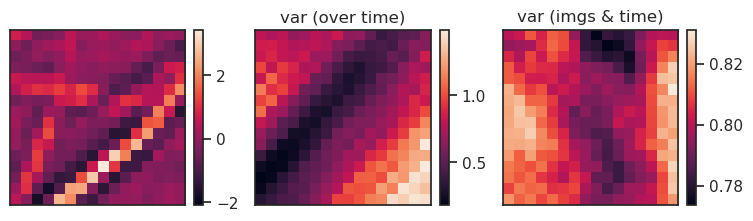

In [15]:
i = 0

ims = []
fig, axes = create_figure(1, 3, (7.5, 2.1), 'all', 'all')
ims.append(axes[0].imshow(tonp(x[i].squeeze())))
ims.append(axes[1].imshow(tonp(var_samples[i])))
ims.append(axes[2].imshow(tonp(var_all)))

axes[1].set_title('var (over time)')
axes[2].set_title('var (imgs & time)')

for im, ax in zip(ims, axes):
    plt.colorbar(im, ax=ax)
remove_ticks(axes, False)

In [16]:
traj = tonp(torch.stack(feeder.trajectory))
traj = pd.DataFrame({
    'x': traj[:, 0],
    'y': traj[:, 1],
    't': range(len(traj)),
})

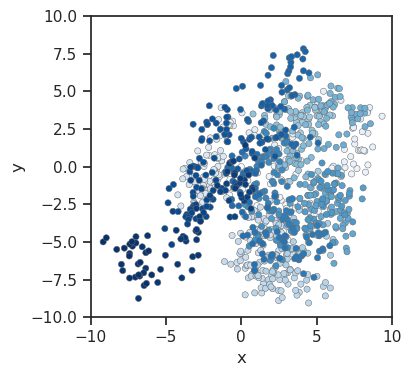

In [18]:
fig, ax = create_figure(1, 1, (4, 4))
sns.scatterplot(data=traj, x='x', y='y', s=20, c=traj['t'], cmap='Blues', edgecolor='dimgrey')
lim = (-10, 10)
ax.set(xlim=lim, ylim=lim)
ax_square(ax)
plt.show()

## 2) RotatingMNISTFeeder

In [19]:
cfg = ConfigPoisVAE(dataset='RotatingMNIST')
tr = Trainer(IPVAE(cfg), ConfigTrain(), device=device)

In [20]:
feeder = tr.get_feeder(seed=123)

#### Test speed

In [21]:
def run(feeder, T=32):
    x_rot = []
    for t in range(T):
        x_rot.append(feeder[t])
    x_rot = torch.cat(x_rot, dim=1)
    return x_rot

In [22]:
%timeit run(feeder)

9.71 ms ± 12.8 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


#### make plots: random $\theta_0$

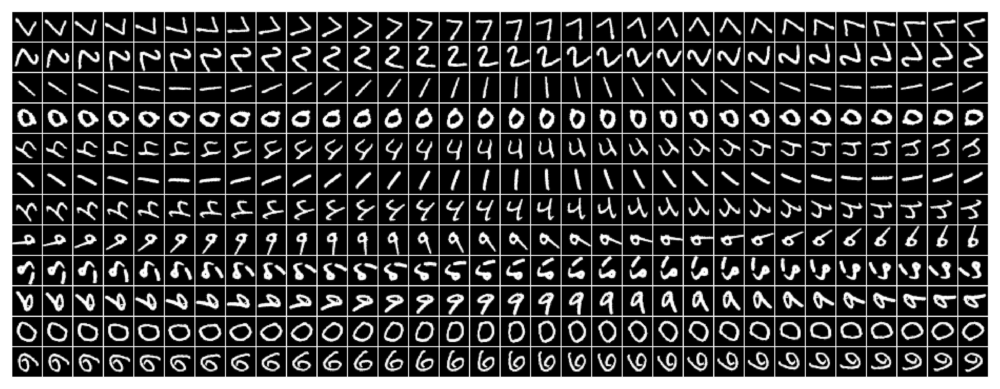

In [23]:
num = 12

x_rot = run(feeder, 32)
x2p = x_rot[:num].view(-1, 28, 28)
_ = plot_weights(x2p, method='none', nrows=num, dpi=500)

#### make plots: fixed $\theta_0 = 0$

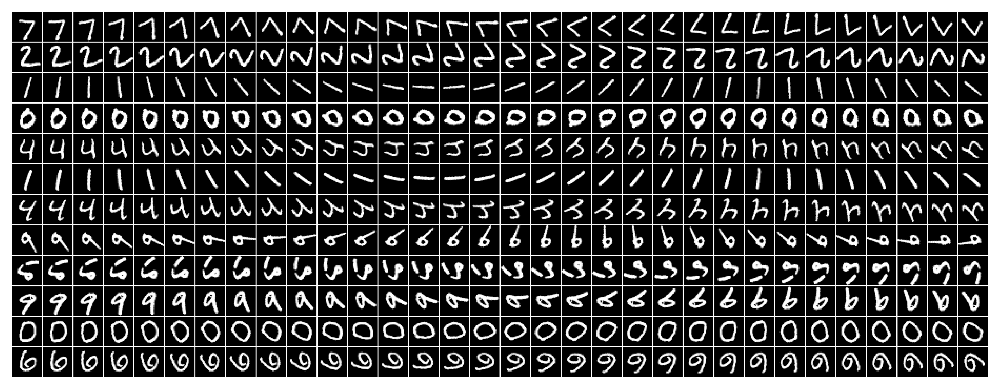

In [24]:
feeder = tr.get_feeder(seed=123, theta_0=0)
x_rot = run(feeder, 32)

num = 12
x2p = x_rot[:num].view(-1, 28, 28)
_ = plot_weights(x2p, method='none', nrows=num, dpi=500)

## 3) StationaryFeeder

In [25]:
cfg = ConfigPoisVAE(dataset='vH16')
tr = Trainer(IPVAE(cfg), ConfigTrain(), device=device)

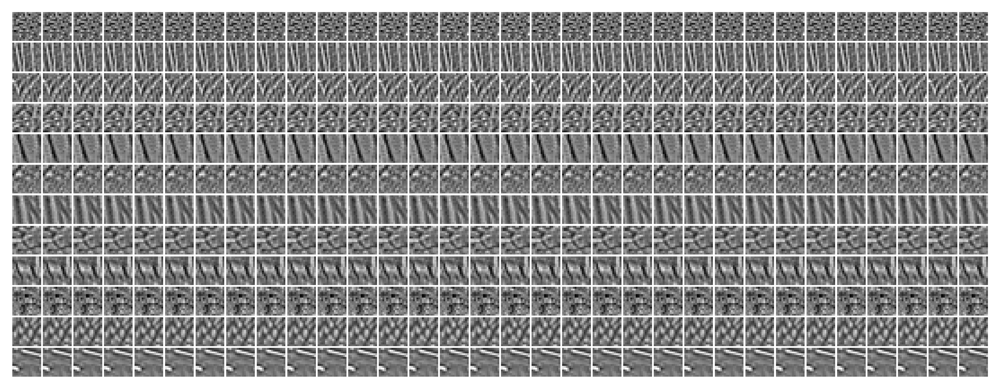

In [26]:
# seed doesn't do anything here (it's going to be gstep in training loop, cfg.seed in validation)
feeder = tr.get_feeder(seed=54)
a = run(feeder, 32)

num = 12
x2p = a[:num].view(-1, 16, 16)
_ = plot_weights(x2p, method='none', nrows=num, dpi=500)